**Chapter 14 – Deep Computer Vision Using Convolutional Neural Networks**

_This notebook contains all the sample code and solutions to the exercises in chapter 14._

<table align="left">
  <td>
    <a href="https://colab.research.google.com/github/ageron/handson-ml3/blob/main/14_deep_computer_vision_with_cnns.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>
  </td>
  <td>
    <a target="_blank" href="https://kaggle.com/kernels/welcome?src=https://github.com/ageron/handson-ml3/blob/main/14_deep_computer_vision_with_cnns.ipynb"><img src="https://kaggle.com/static/images/open-in-kaggle.svg" /></a>
  </td>
</table>

# Setup

This project requires Python 3.7 or above:

In [1]:
from IPython.core.interactiveshell import InteractiveShell # make all output in ipython show, not just last line
InteractiveShell.ast_node_interactivity = "all"   # pretty print all cell's output and not just the last one
%matplotlib inline
import sklearn
sklearn.set_config(display="diagram")

In [2]:
import sys

assert sys.version_info >= (3, 7)

It also requires Scikit-Learn ≥ 1.0.1:

In [3]:
from packaging import version
import sklearn

assert version.parse(sklearn.__version__) >= version.parse("1.0.1")

And TensorFlow ≥ 2.8:

In [4]:
import tensorflow as tf

assert version.parse(tf.__version__) >= version.parse("2.8.0")

As we did in earlier chapters, let's define the default font sizes to make the figures prettier:

In [5]:
import matplotlib.pyplot as plt

plt.rc('font', size=14)
plt.rc('axes', labelsize=14, titlesize=14)
plt.rc('legend', fontsize=14)
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)

This chapter can be very slow without a GPU, so let's make sure there's one, or else issue a warning:

In [6]:
# Is this notebook running on Colab or Kaggle?
IS_COLAB = "google.colab" in sys.modules
IS_KAGGLE = "kaggle_secrets" in sys.modules

if not tf.config.list_physical_devices('GPU'):
    print("No GPU was detected. Neural nets can be very slow without a GPU.")
    if IS_COLAB:
        print("Go to Runtime > Change runtime and select a GPU hardware "
              "accelerator.")
    if IS_KAGGLE:
        print("Go to Settings > Accelerator and select GPU.")

# Convolutional Layers
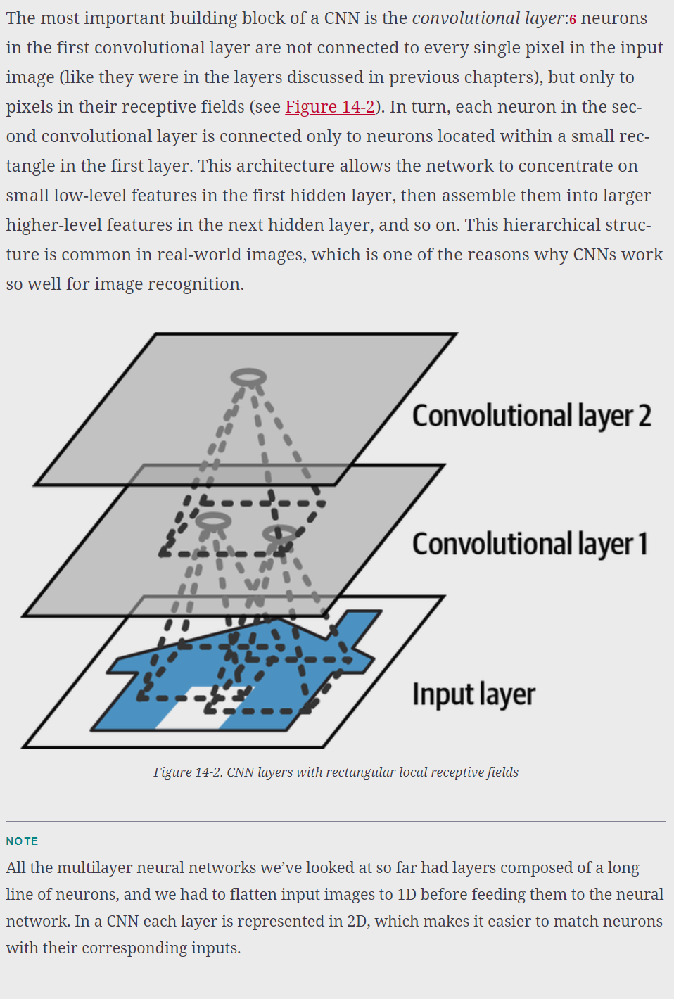
A neuron located in row i, column j of a given layer is connected to the outputs of the neurons in the previous layer located in rows i to i + fh – 1, columns j to j + fw – 1, where fh and fw are the height and width of the receptive field (see Figure 14-3). In order for a layer to have the same height and width as the previous layer, it is common to add zeros around the inputs, as shown in the diagram. This is called zero padding.
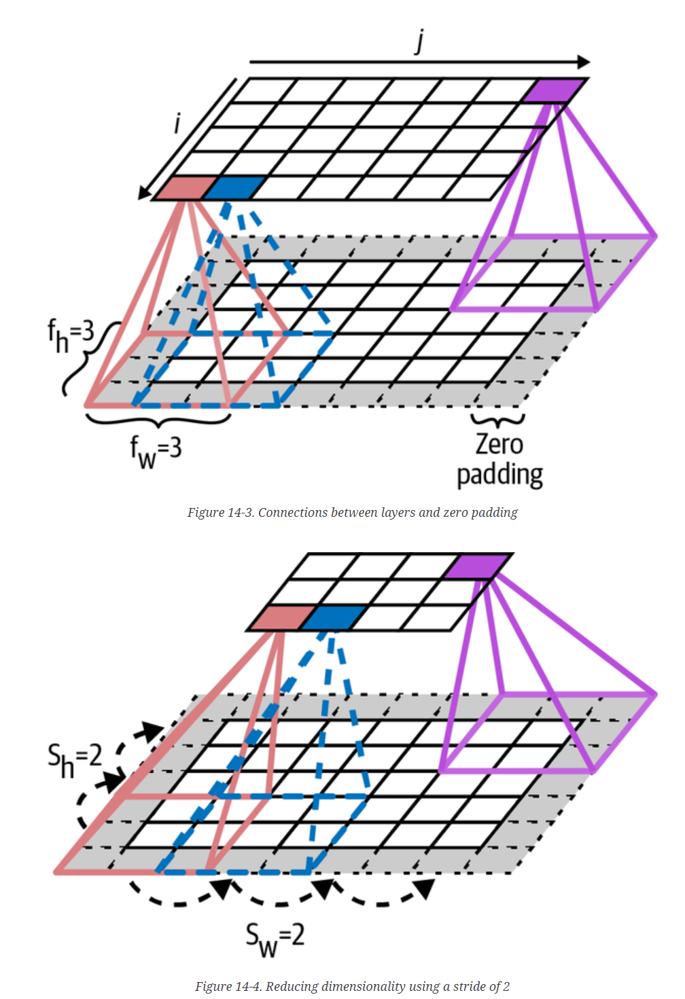
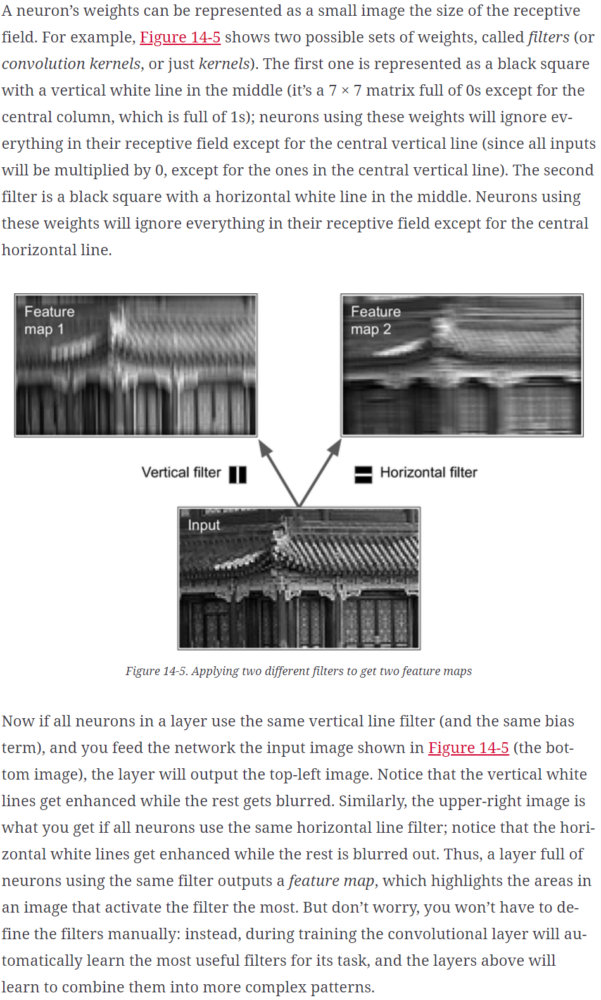
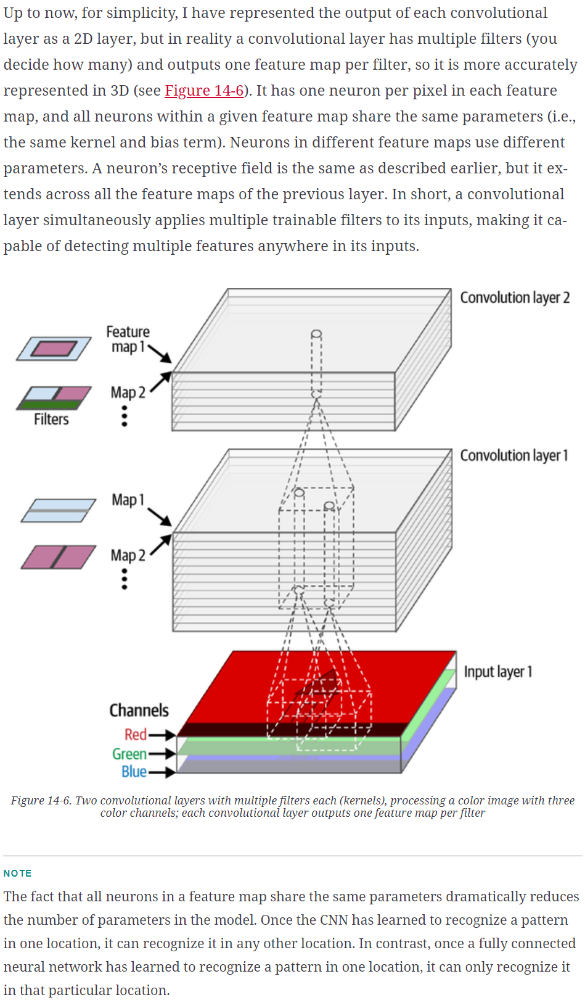

## Implementing Convolutional Layers With Keras

Let's load two sample images, rescale their pixel values to 0-1, and center crop them to small 70×120 images:

First, let’s load and preprocess a couple of sample images, using Scikit-Learn’s load_sample_image() function and Keras’s CenterCrop and Rescaling layers (all of which were introduced in Chapter 13):

In [7]:
from sklearn.datasets import load_sample_images
import tensorflow as tf

images = load_sample_images()["images"]
images = tf.keras.layers.CenterCrop(height=70, width=120)(images)
images = tf.keras.layers.Rescaling(scale=1 / 255)(images)

In [8]:
images.shape

TensorShape([2, 70, 120, 3])

Well, there are two sample images, which explains the first dimension. Then each image is 70 × 120, since that’s the size we specified when creating the CenterCrop layer (the original images were 427 × 640). This explains the second and third dimensions. And lastly, each pixel holds one value per color channel, and there are three of them—red, green, and blue—which explains the last dimension.

When we talk about a 2D convolutional layer, “2D” refers to the number of spatial dimensions (height and width), but as you can see, the layer takes 4D inputs: as we saw, the two additional dimensions are the batch size (first dimension) and the channels (last dimension).

Now let’s create a 2D convolutional layer and feed it these images to see what comes out. For this, Keras provides a Convolution2D layer, alias Conv2D. Under the hood, this layer relies on TensorFlow’s tf.nn.conv2d() operation. Let’s create a convolutional layer with 32 filters, each of size 7 × 7 (using kernel_size=7, which is equivalent to using kernel_size=(7 , 7)), and apply this layer to our small batch of two images:

In [9]:
tf.random.set_seed(42)  # extra code – ensures reproducibility
conv_layer = tf.keras.layers.Conv2D(filters=32, kernel_size=7)
fmaps = conv_layer(images)

In [10]:
fmaps.shape

TensorShape([2, 64, 114, 32])

The output shape is similar to the input shape, with two main differences. First, there are 32 channels instead of 3. This is because we set filters=32, so we get 32 output feature maps: instead of the intensity of red, green, and blue at each location, we now have the intensity of each feature at each location. Second, the height and width have both shrunk by 6 pixels. This is due to the fact that the Conv2D layer does not use any zero-padding by default, which means that we lose a few pixels on the sides of the output feature maps, depending on the size of the filters. In this case, since the kernel size is 7, we lose 6 pixels horizontally and 6 pixels vertically (i.e., 3 pixels on each side).

<Figure size 1500x900 with 0 Axes>

<AxesSubplot:>

(-0.5, 113.5, 63.5, -0.5)

<AxesSubplot:>

(-0.5, 113.5, 63.5, -0.5)

<AxesSubplot:>

(-0.5, 113.5, 63.5, -0.5)

<AxesSubplot:>

(-0.5, 113.5, 63.5, -0.5)

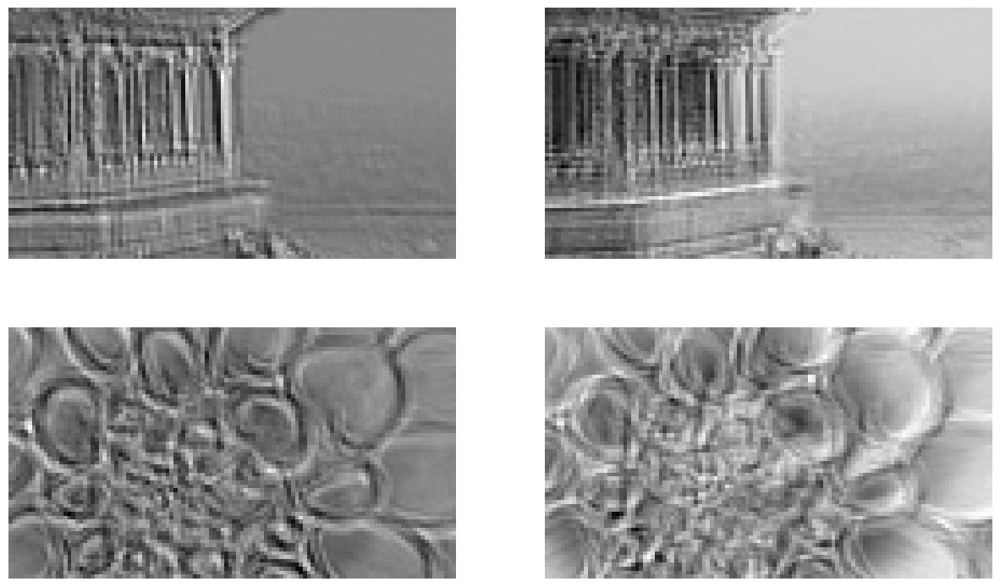

In [11]:
# extra code – displays the two output feature maps for each image

plt.figure(figsize=(15, 9))
for image_idx in (0, 1):
    for fmap_idx in (0, 1):
        plt.subplot(2, 2, image_idx * 2 + fmap_idx + 1)
        plt.imshow(fmaps[image_idx, :, :, fmap_idx], cmap="gray")
        plt.axis("off")

plt.show()

As you can see, randomly generated filters typically act like edge detectors, which is great since that's a useful tool in image processing, and that's the type of filters that a convolutional layer typically starts with. Then, during training, it gradually learns improved filters to recognize useful patterns for the task.

Now let's use zero-padding:

The default option is surprisingly named padding="valid", which actually means no zero-padding at all! This name comes from the fact that in this case every neuron’s receptive field lies strictly within valid positions inside the input (it does not go out of bounds). It’s not a Keras naming quirk: everyone uses this odd nomenclature.

If instead we set padding="same", then the inputs are padded with enough zeros on all sides to ensure that the output feature maps end up with the same size as the inputs (hence the name of this option):

In [12]:
conv_layer = tf.keras.layers.Conv2D(filters=32, kernel_size=7,
                                    padding="same")
fmaps = conv_layer(images)

In [13]:
fmaps.shape

TensorShape([2, 70, 120, 32])

In [14]:
# extra code – shows that the output shape when we set strides=2
conv_layer = tf.keras.layers.Conv2D(filters=32, kernel_size=7, padding="same",
                                    strides=2)
fmaps = conv_layer(images)
fmaps.shape

TensorShape([2, 35, 60, 32])

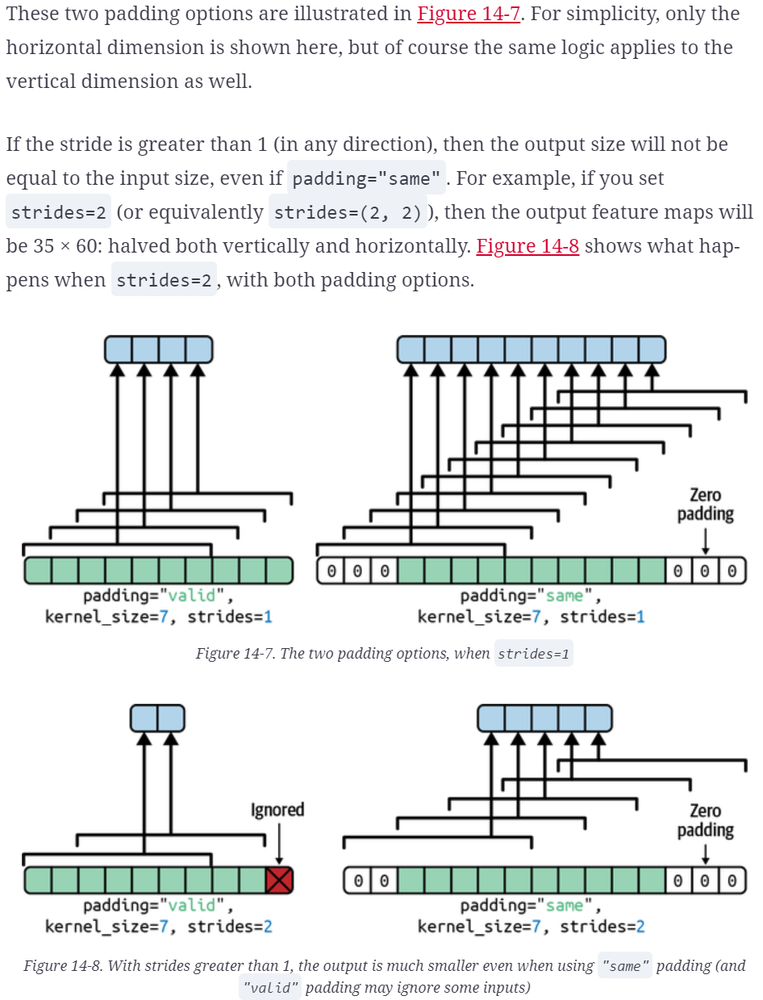

In [15]:
# extra code – this utility function can be useful to compute the size of the
#              feature maps output by a convolutional layer. It also returns
#              the number of ignored rows or columns if padding="valid", or the
#              number of zero-padded rows or columns if padding="same"."""

import numpy as np

def conv_output_size(input_size, kernel_size, strides=1, padding="valid"):
    if padding=="valid":
        z = input_size - kernel_size + strides
        output_size = z // strides
        num_ignored = z % strides
        return output_size, num_ignored
    else:
        output_size = (input_size - 1) // strides + 1
        num_padded = (output_size - 1) * strides + kernel_size - input_size
        return output_size, num_padded

conv_output_size(np.array([70, 120]), kernel_size=7, strides=2, padding="same")

(array([35, 60], dtype=int32), array([5, 5]))

With padding="valid", if the width of the input is ih, then the output width is equal to (ih – fh + sh) / sh, rounded down. Recall that fh is the kernel width, and sh is the horizontal stride. Any remainder in the division corresponds to ignored columns on the right side of the input image. The same logic can be used to compute the output height, and any ignored rows at the bottom of the image.

With padding="same", the output width is equal to ih / sh, rounded up. To make this possible, the appropriate number of zero columns are padded to the left and right of the input image (an equal number if possible, or just one more on the right side). Assuming the output width is ow, then the number of padded zero columns is (ow – 1) × sh + fh – ih. Again, the same logic can be used to compute the output height and the number of padded rows.

Let's now look at the weights:

The kernels array is 4D, and its shape is [kernel_height, kernel_width, input_channels, output_channels]. The biases array is 1D, with shape [output_channels]. The number of output channels is equal to the number of output feature maps, which is also equal to the number of filters.

Most importantly, note that the height and width of the input images do not appear in the kernel’s shape: this is because all the neurons in the output feature maps share the same weights, as explained earlier. This means that you can feed images of any size to this layer, as long as they are at least as large as the kernels, and if they have the right number of channels (three in this case).

Lastly, you will generally want to specify an activation function (such as ReLU) when creating a Conv2D layer, and also specify the corresponding kernel initializer (such as He initialization). This is for the same reason as for Dense layers: a convolutional layer performs a linear operation, so if you stacked multiple convolutional layers without any activation functions they would all be equivalent to a single convolutional layer, and they wouldn’t be able to learn anything really complex.

In [16]:
kernels, biases = conv_layer.get_weights()
kernels.shape

(7, 7, 3, 32)

In [17]:
biases.shape

(32,)

In [18]:
# extra code – shows how to use the tf.nn.conv2d() operation

tf.random.set_seed(42)
filters = tf.random.normal([7, 7, 3, 2])
biases = tf.zeros([2])
fmaps = tf.nn.conv2d(images, filters, strides=1, padding="SAME") + biases

Let's manually create two filters full of zeros, except for a vertical line of 1s in the first filter, and a horizontal one in the second filter (just like in Figure 14–5). The two output feature maps highlight vertical lines and horizontal lines, respectively. In practice you will probably never need to create filters manually, since the convolutional layers will learn them automatically.

<Figure size 1500x900 with 0 Axes>

<AxesSubplot:>

(-0.5, 119.5, 69.5, -0.5)

<AxesSubplot:>

(-0.5, 119.5, 69.5, -0.5)

<AxesSubplot:>

(-0.5, 119.5, 69.5, -0.5)

<AxesSubplot:>

(-0.5, 119.5, 69.5, -0.5)

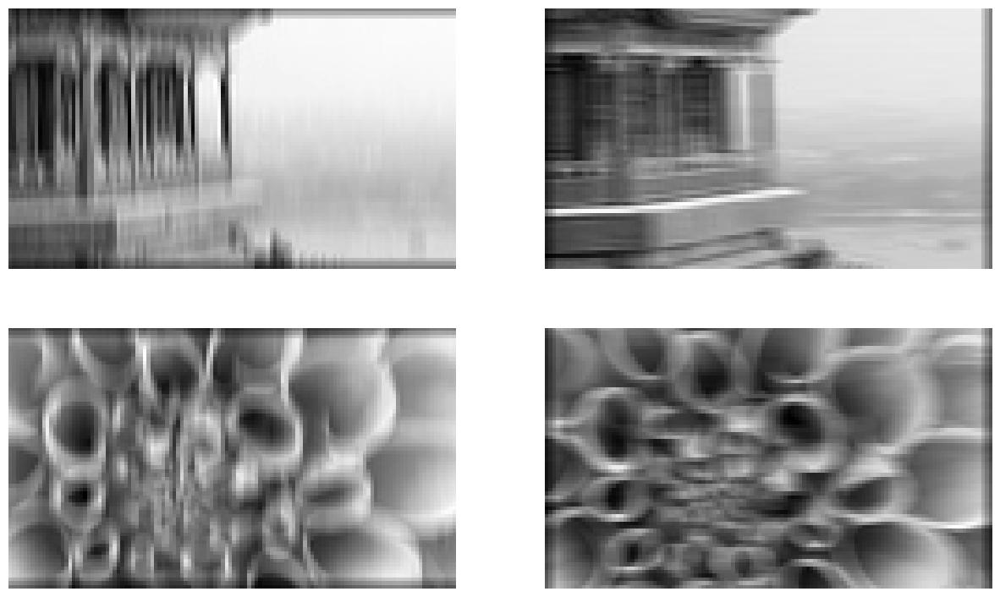

In [19]:
# extra code – shows how to manually create two filters to get images similar
#              to those in Figure 14–5.

plt.figure(figsize=(15, 9))
filters = np.zeros([7, 7, 3, 2])
filters[:, 3, :, 0] = 1
filters[3, :, :, 1] = 1
fmaps = tf.nn.conv2d(images, filters, strides=1, padding="SAME") + biases

for image_idx in (0, 1):
    for fmap_idx in (0, 1):
        plt.subplot(2, 2, image_idx * 2 + fmap_idx + 1)
        plt.imshow(fmaps[image_idx, :, :, fmap_idx], cmap="gray")
        plt.axis("off")

plt.show()

Notice the dark lines at the top and bottom of the two images on the left, and on the left and right of the two images on the right? Can you guess what these are? Why were they not present in the previous figure?

You guessed it! These are artifacts due to the fact that we used zero padding in this case, while we did not use zero padding to create the feature maps in the previous figure. Because of zero padding, the two feature maps based on the vertical line filter (i.e., the two left images) could not fully activate near the top and bottom of the images. Similarly, the two feature maps based on the horizontal line filter (i.e., the two right images) could not fully activate near the left and right of the images.

Another challenge with CNNs is that the convolutional layers require a huge amount of RAM. This is especially true during training, because the reverse pass of backpropagation requires all the intermediate values computed during the forward pass.

For example, consider a convolutional layer with 200 5 × 5 filters, with stride 1 and "same" padding. If the input is a 150 × 100 RGB image (three channels), then the number of parameters is (5 × 5 × 3 + 1) × 200 = 15,200 (the + 1 corresponds to the bias terms), which is fairly small compared to a fully connected layer.⁠7 However, each of the 200 feature maps contains 150 × 100 neurons, and each of these neurons needs to compute a weighted sum of its 5 × 5 × 3 = 75 inputs: that’s a total of 225 million float multiplications. Not as bad as a fully connected layer, but still quite computationally intensive. Moreover, if the feature maps are represented using 32-bit floats, then the convolutional layer’s output will occupy 200 × 150 × 100 × 32 = 96 million bits (12 MB) of RAM.⁠8 And that’s just for one instance—if a training batch contains 100 instances, then this layer will use up 1.2 GB of RAM!

During inference (i.e., when making a prediction for a new instance) the RAM occupied by one layer can be released as soon as the next layer has been computed, so you only need as much RAM as required by two consecutive layers. But during training everything computed during the forward pass needs to be preserved for the reverse pass, so the amount of RAM needed is (at least) the total amount of RAM required by all layers.

# Pooling Layers
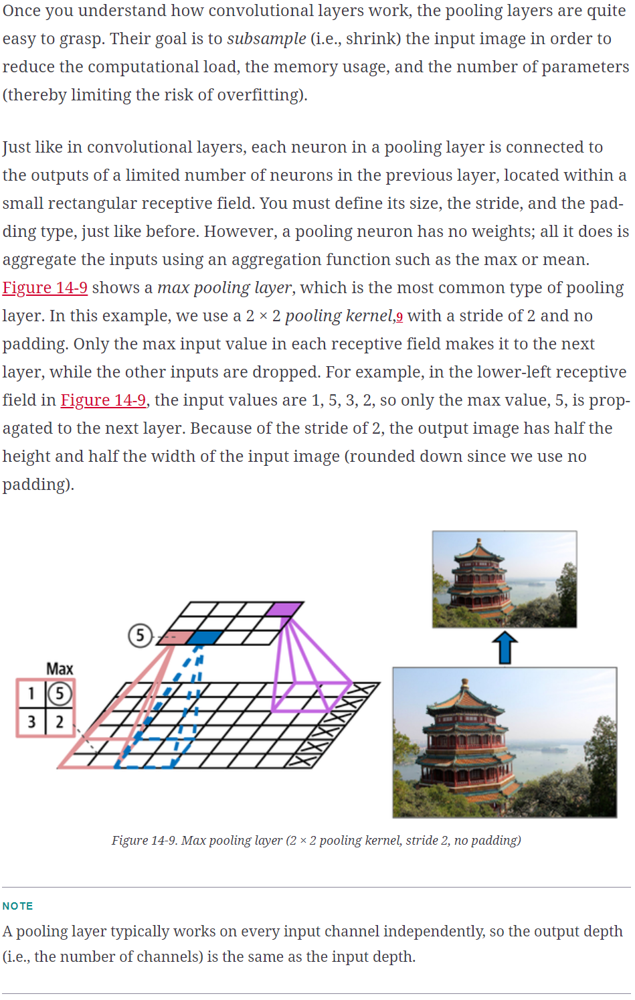

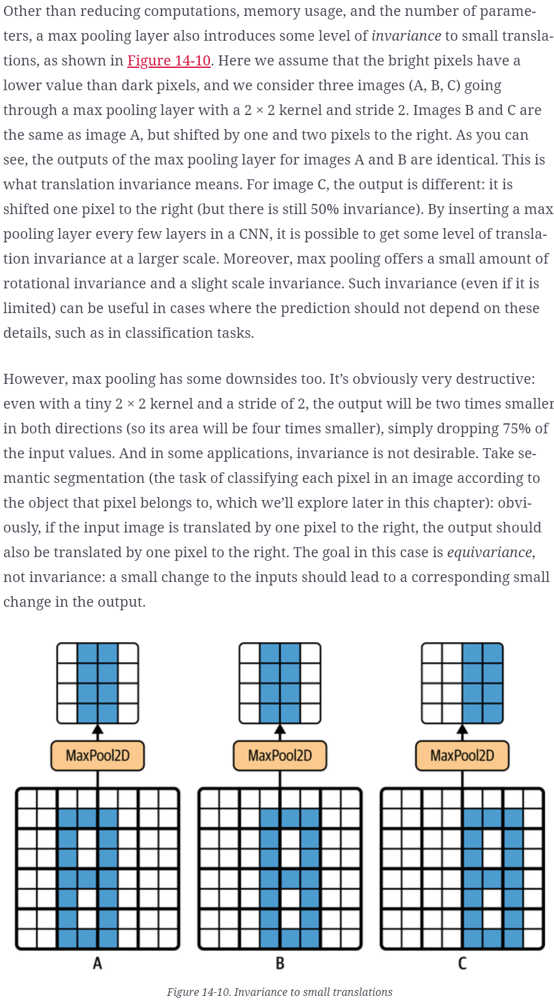

## Implementing Pooling Layers With Keras
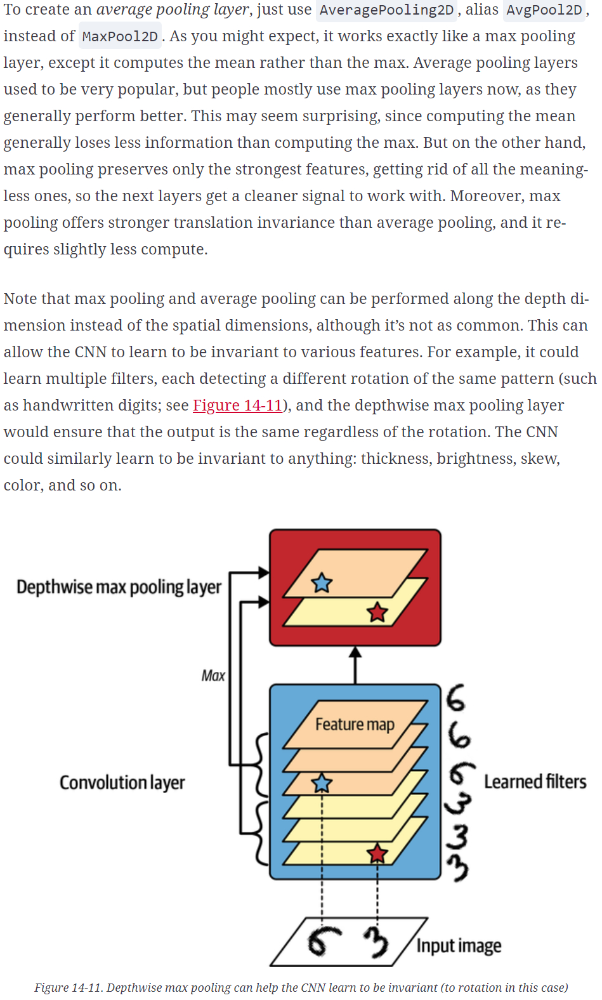

**Max pooling**

In [20]:
max_pool = tf.keras.layers.MaxPool2D(pool_size=2)

In [21]:
output = max_pool(images)

Text(0.5, 1.0, 'Input')

(-0.5, 119.5, 69.5, -0.5)

Text(0.5, 1.0, 'Output')

(-0.5, 59.5, 34.5, -0.5)

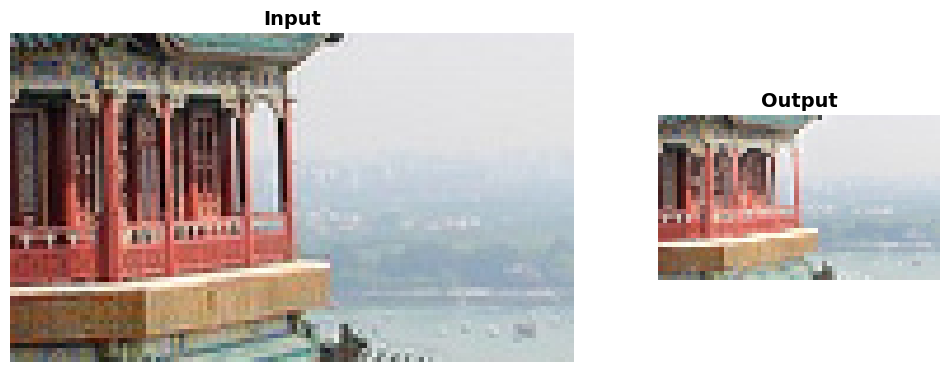

In [22]:
# extra code – this cells shows what max pooling with stride = 2 looks like

import matplotlib as mpl

fig = plt.figure(figsize=(12, 8))
gs = mpl.gridspec.GridSpec(nrows=1, ncols=2, width_ratios=[2, 1])

ax1 = fig.add_subplot(gs[0, 0])
ax1.set_title("Input")
ax1.imshow(images[0])  # plot the 1st image
ax1.axis("off")
ax2 = fig.add_subplot(gs[0, 1])
ax2.set_title("Output")
ax2.imshow(output[0])  # plot the output for the 1st image
ax2.axis("off")
plt.show()

**Depth-wise pooling**

Keras does not include a depthwise max pooling layer, but it’s not too difficult to implement a custom layer for that:

In [23]:
# extra code – shows how to use the max_pool() op; only works on the CPU
np.random.seed(42)
fmaps = np.random.rand(2, 70, 120, 60)
with tf.device("/cpu:0"):
    output = tf.nn.max_pool(fmaps, ksize=(1, 1, 1, 3), strides=(1, 1, 1, 3),
                            padding="VALID")
output.shape

TensorShape([2, 70, 120, 20])

In [24]:
class DepthPool(tf.keras.layers.Layer):
    def __init__(self, pool_size=2, **kwargs):
        super().__init__(**kwargs)
        self.pool_size = pool_size
    
    def call(self, inputs):
        shape = tf.shape(inputs)  # shape[-1] is the number of channels
        groups = shape[-1] // self.pool_size  # number of channel groups
        new_shape = tf.concat([shape[:-1], [groups, self.pool_size]], axis=0)
        return tf.reduce_max(tf.reshape(inputs, new_shape), axis=-1)

In [25]:
# extra code – shows that this custom layer gives the same result as max_pool()
np.allclose(DepthPool(pool_size=3)(fmaps), output)

True

<Figure size 1200x800 with 0 Axes>

<AxesSubplot:>

Text(0.5, 1.0, 'Input')

(-0.5, 119.5, 69.5, -0.5)

<AxesSubplot:>

Text(0.5, 1.0, 'Output')

(-0.5, 119.5, 69.5, -0.5)

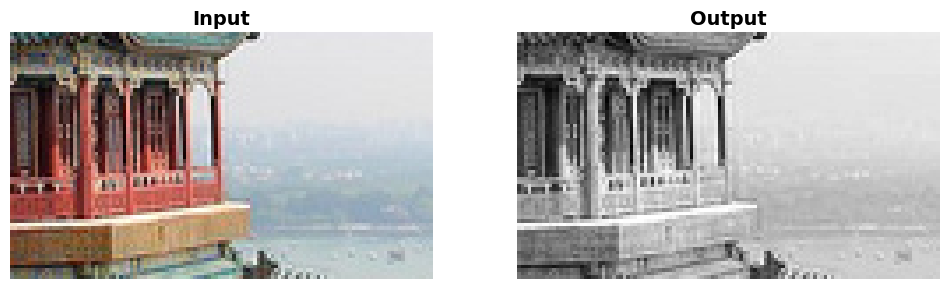

In [26]:
# extra code – computes and displays the output of the depthwise pooling layer

depth_output = DepthPool(pool_size=3)(images)

plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.title("Input")
plt.imshow(images[0])  # plot the 1st image
plt.axis("off")
plt.subplot(1, 2, 2)
plt.title("Output")
plt.imshow(depth_output[0, ..., 0], cmap="gray")  # plot 1st image's output
plt.axis("off")
plt.show()

This layer reshapes its inputs to split the channels into groups of the desired size (pool_size), then it uses tf.reduce_max() to compute the max of each group. This implementation assumes that the stride is equal to the pool size, which is generally what you want. Alternatively, you could use TensorFlow’s tf.nn.max_pool() operation, and wrap in a Lambda layer to use it inside a Keras model, but sadly this op does not implement depthwise pooling for the GPU, only for the CPU.

One last type of pooling layer that you will often see in modern architectures is the global average pooling layer. It works very differently: all it does is compute the mean of each entire feature map (it’s like an average pooling layer using a pooling kernel with the same spatial dimensions as the inputs). This means that it just outputs a single number per feature map and per instance. Although this is of course extremely destructive (most of the information in the feature map is lost), it can be useful just before the output layer, as you will see later in this chapter. To create such a layer, simply use the GlobalAveragePooling2D class, alias GlobalAvgPool2D:

**Global Average Pooling**

In [27]:
global_avg_pool = tf.keras.layers.GlobalAvgPool2D()

The following layer is equivalent:

In [28]:
global_avg_pool = tf.keras.layers.Lambda(
    lambda X: tf.reduce_mean(X, axis=[1, 2]))

In [29]:
global_avg_pool(images)

<tf.Tensor: shape=(2, 3), dtype=float32, numpy=
array([[0.643388  , 0.59718215, 0.5825038 ],
       [0.7630747 , 0.2601088 , 0.10848834]], dtype=float32)>

# CNN Architectures
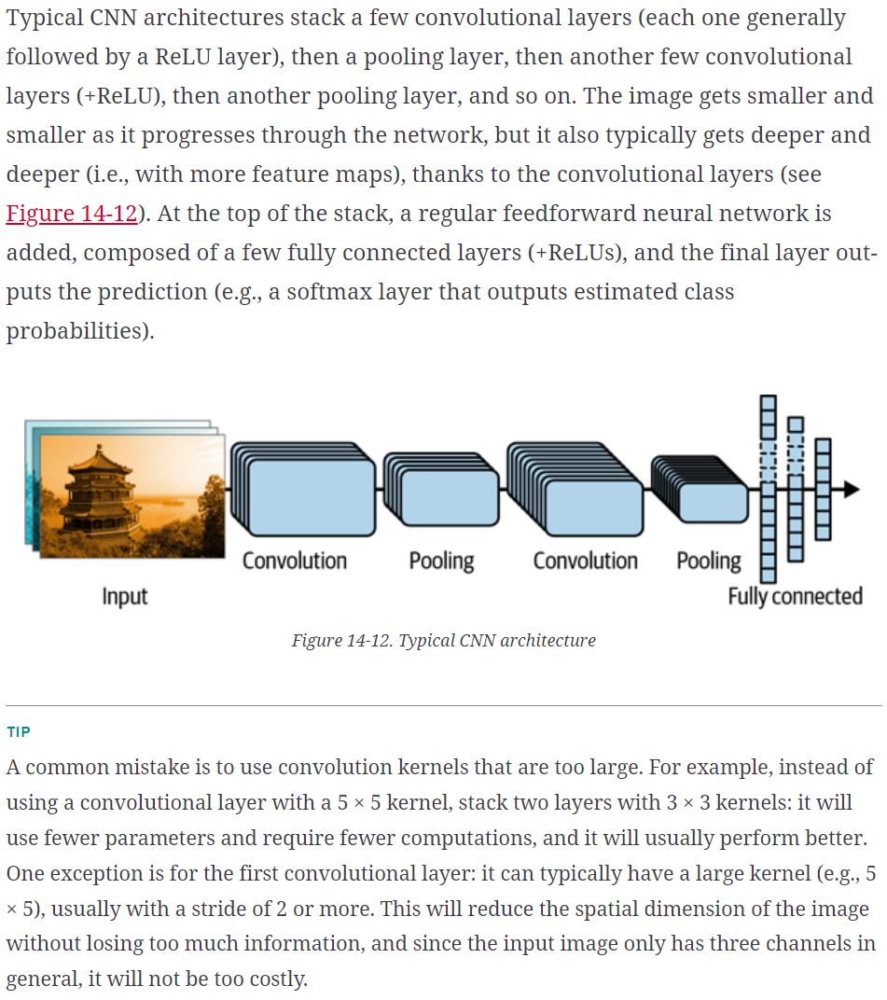

**Tackling Fashion MNIST With a CNN**

We use the functools.partial() function (introduced in Chapter 11) to define DefaultConv2D, which acts just like Conv2D but with different default arguments: a small kernel size of 3, "same" padding, the ReLU activation function, and its corresponding He initializer.

Next, we create the Sequential model. Its first layer is a DefaultConv2D with 64 fairly large filters (7 × 7). It uses the default stride of 1 because the input images are not very large. It also sets input_shape=[28, 28, 1], because the images are 28 × 28 pixels, with a single color channel (i.e., grayscale). When you load the Fashion MNIST dataset, make sure each image has this shape: you may need to use np.reshape() or np.expanddims() to add the channels dimension. Alternatively, you could use a Reshape layer as the first layer in the model.

We then add a max pooling layer that uses the default pool size of 2, so it divides each spatial dimension by a factor of 2.

Then we repeat the same structure twice: two convolutional layers followed by a max pooling layer. For larger images, we could repeat this structure several more times. The number of repetitions is a hyperparameter you can tune.

Note that the number of filters doubles as we climb up the CNN toward the output layer (it is initially 64, then 128, then 256): it makes sense for it to grow, since the number of low-level features is often fairly low (e.g., small circles, horizontal lines), but there are many different ways to combine them into higher-level features. It is a common practice to double the number of filters after each pooling layer: since a pooling layer divides each spatial dimension by a factor of 2, we can afford to double the number of feature maps in the next layer without fear of exploding the number of parameters, memory usage, or computational load.

Next is the fully connected network, composed of two hidden dense layers and a dense output layer. Since it’s a classification task with 10 classes, the output layer has 10 units, and it uses the softmax activation function. Note that we must flatten the inputs just before the first dense layer, since it expects a 1D array of features for each instance. We also add two dropout layers, with a dropout rate of 50% each, to reduce overfitting.

In [30]:
# extra code – loads the mnist dataset, add the channels axis to the inputs,
#              scales the values to the 0-1 range, and splits the dataset
mnist = tf.keras.datasets.fashion_mnist.load_data()
(X_train_full, y_train_full), (X_test, y_test) = mnist
X_train_full = np.expand_dims(X_train_full, axis=-1).astype(np.float32) / 255
X_test = np.expand_dims(X_test.astype(np.float32), axis=-1) / 255
X_train, X_valid = X_train_full[:-5000], X_train_full[-5000:]
y_train, y_valid = y_train_full[:-5000], y_train_full[-5000:]

In [31]:
from functools import partial

tf.random.set_seed(42)  # extra code – ensures reproducibility
DefaultConv2D = partial(tf.keras.layers.Conv2D, kernel_size=3, padding="same",
                        activation="relu", kernel_initializer="he_normal")
model = tf.keras.Sequential([
    DefaultConv2D(filters=64, kernel_size=7, input_shape=[28, 28, 1]),
    tf.keras.layers.MaxPool2D(),
    DefaultConv2D(filters=128),
    DefaultConv2D(filters=128),
    tf.keras.layers.MaxPool2D(),
    DefaultConv2D(filters=256),
    DefaultConv2D(filters=256),
    tf.keras.layers.MaxPool2D(),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(units=128, activation="relu",
                          kernel_initializer="he_normal"),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(units=64, activation="relu",
                          kernel_initializer="he_normal"),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(units=10, activation="softmax")
])

In [32]:
# extra code – compiles, fits, evaluates, and uses the model to make predictions
model.compile(loss="sparse_categorical_crossentropy", optimizer="nadam",
              metrics=["accuracy"])
history = model.fit(X_train, y_train, epochs=10,
                    validation_data=(X_valid, y_valid))
score = model.evaluate(X_test, y_test)
X_new = X_test[:10]  # pretend we have new images
y_pred = model.predict(X_new)

Epoch 1/10
1719/1719 [==============================] - 45s 25ms/step - loss: 0.7140 - accuracy: 0.7523 - val_loss: 0.3885 - val_accuracy: 0.8652
Epoch 2/10
1719/1719 [==============================] - 46s 27ms/step - loss: 0.4075 - accuracy: 0.8629 - val_loss: 0.3089 - val_accuracy: 0.8852
Epoch 3/10
1719/1719 [==============================] - 44s 26ms/step - loss: 0.3445 - accuracy: 0.8831 - val_loss: 0.2993 - val_accuracy: 0.8882
Epoch 4/10
1719/1719 [==============================] - 46s 27ms/step - loss: 0.3154 - accuracy: 0.8937 - val_loss: 0.2634 - val_accuracy: 0.8988
Epoch 5/10
1719/1719 [==============================] - 48s 28ms/step - loss: 0.2853 - accuracy: 0.9022 - val_loss: 0.2676 - val_accuracy: 0.8966
Epoch 6/10
1719/1719 [==============================] - 45s 26ms/step - loss: 0.2668 - accuracy: 0.9092 - val_loss: 0.2653 - val_accuracy: 0.9016
Epoch 7/10
1719/1719 [==============================] - 48s 28ms/step - loss: 0.2548 - accuracy: 0.9142 - val_loss: 0.2678 -

We will first look at the classical LeNet-5 architecture (1998), then several winners of the ILSVRC challenge: AlexNet (2012), GoogLeNet (2014), ResNet (2015), and SENet (2017). Along the way, we will also look at a few more architectures, including Xception, ResNeXt, DenseNet, MobileNet, CSPNet, and EfficientNet.

## LeNet-5

The famous LeNet-5 architecture had the following layers:

Layer  | Type            | Maps | Size     | Kernel size | Stride | Activation
-------|-----------------|------|----------|-------------|--------|-----------
 Out   | Fully connected | –    | 10       | –           | –      | RBF
 F6    | Fully connected | –    | 84       | –           | –      | tanh
 C5    | Convolution     | 120  | 1 × 1    | 5 × 5       | 1      | tanh
 S4    | Avg pooling     | 16   | 5 × 5    | 2 × 2       | 2      | tanh
 C3    | Convolution     | 16   | 10 × 10  | 5 × 5       | 1      | tanh
 S2    | Avg pooling     | 6    | 14 × 14  | 2 × 2       | 2      | tanh
 C1    | Convolution     | 6    | 28 × 28  | 5 × 5       | 1      | tanh
 In    | Input           | 1    | 32 × 32  | –           | –      | –

There were a few tweaks here and there, which don't really matter much anymore, but in case you are interested, here they are:

* MNIST images are 28 × 28 pixels, but they are zero-padded to 32 × 32 pixels and normalized before being fed to the network. The rest of the network does not use any padding, which is why the size keeps shrinking as the image progresses through the network.
* The average pooling layers are slightly more complex than usual: each neuron computes the mean of its inputs, then multiplies the result by a learnable coefficient (one per map) and adds a learnable bias term (again, one per map), then finally applies the activation function.
* Most neurons in C3 maps are connected to neurons in only three or four S2 maps (instead of all six S2 maps). See table 1 (page 8) in the [original paper](https://homl.info/lenet5) for details.
* The output layer is a bit special: instead of computing the matrix multiplication of the inputs and the weight vector, each neuron outputs the square of the Euclidian distance between its input vector and its weight vector. Each output measures how much the image belongs to a particular digit class. The cross-entropy cost function is now preferred, as it penalizes bad predictions much more, producing larger gradients and converging faster.

# Implementing a ResNet-34 CNN Using Keras

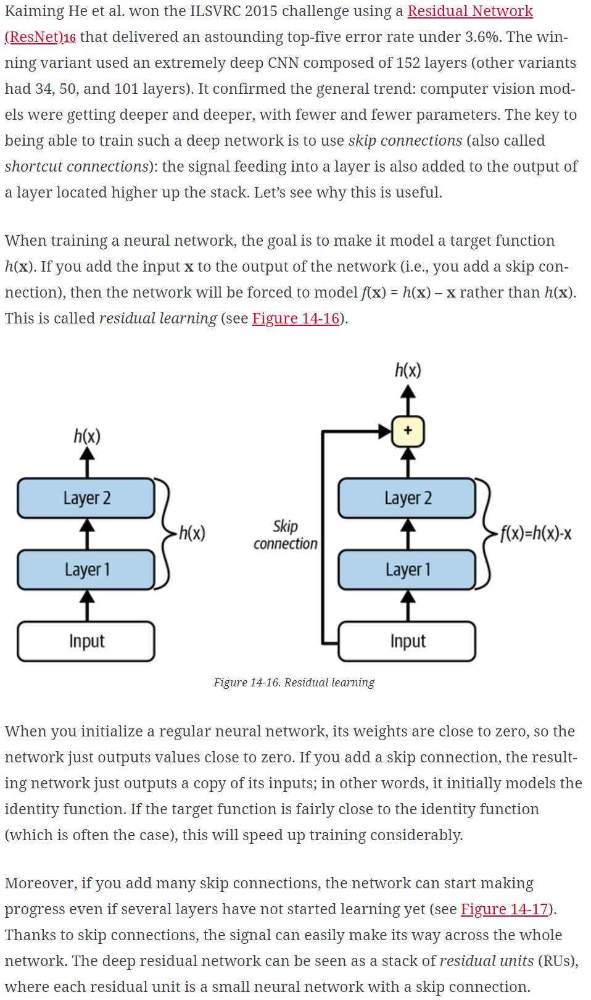
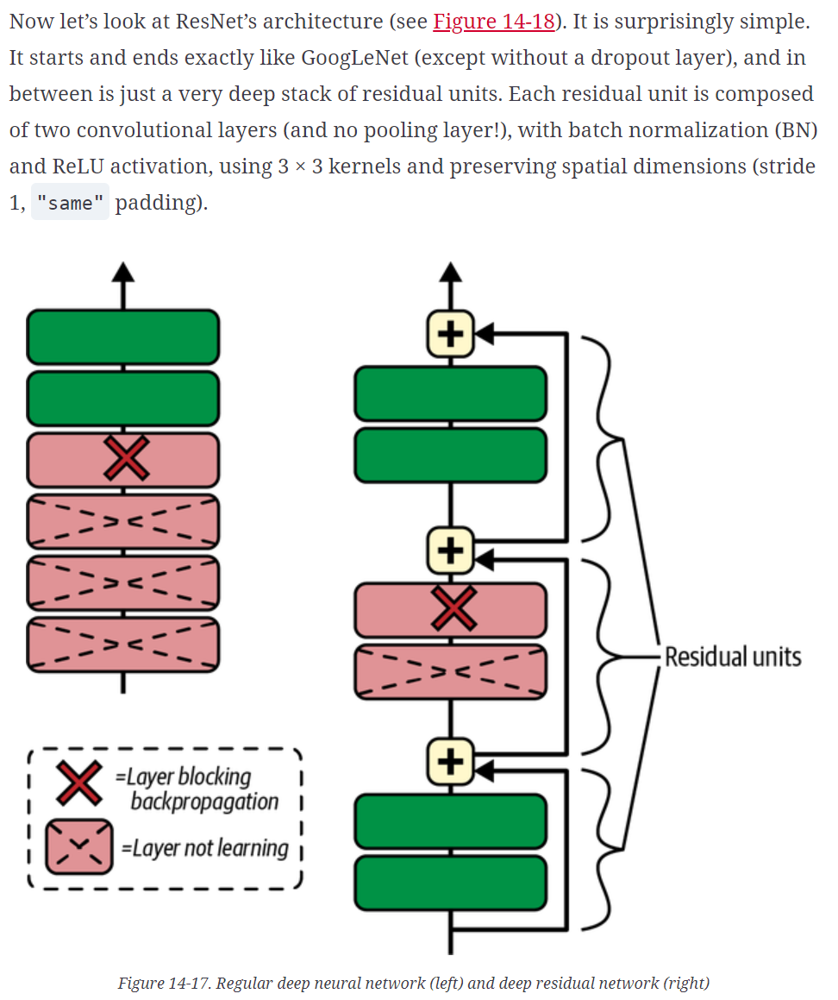
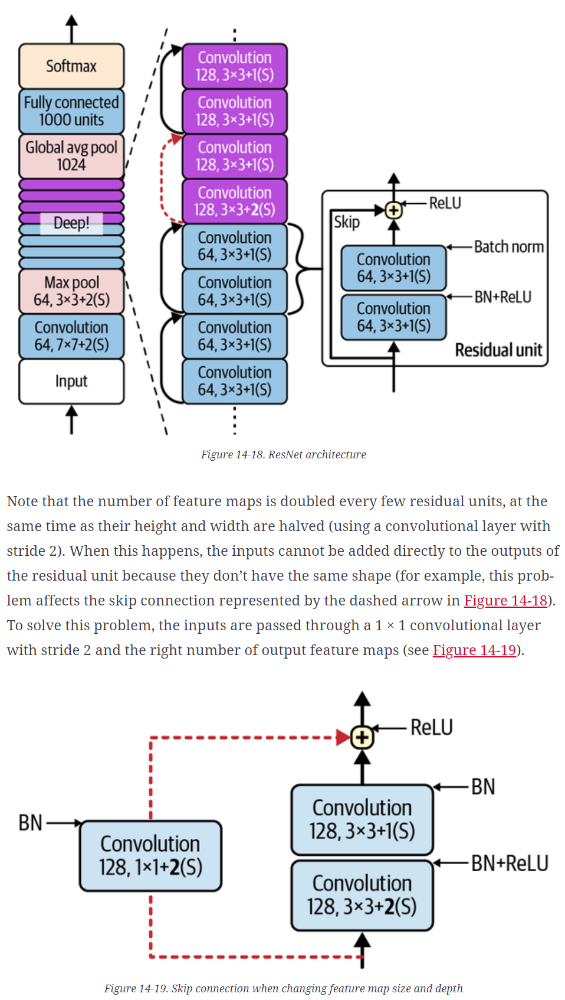

In [33]:
# ResNet from scratch uisng Keras
# this implments the residual unit

DefaultConv2D = partial(tf.keras.layers.Conv2D, kernel_size=3, strides=1,
                        padding="same", kernel_initializer="he_normal",
                        use_bias=False)

class ResidualUnit(tf.keras.layers.Layer):
    def __init__(self, filters, strides=1, activation="relu", **kwargs):
        super().__init__(**kwargs)
        self.activation = tf.keras.activations.get(activation)
        self.main_layers = [
            DefaultConv2D(filters, strides=strides),
            tf.keras.layers.BatchNormalization(),
            self.activation,
            DefaultConv2D(filters),
            tf.keras.layers.BatchNormalization()
        ]
        self.skip_layers = []
        if strides > 1:
            self.skip_layers = [
                DefaultConv2D(filters, kernel_size=1, strides=strides),
                tf.keras.layers.BatchNormalization()
            ]

    def call(self, inputs):
        Z = inputs
        for layer in self.main_layers:
            Z = layer(Z)
        skip_Z = inputs
        for layer in self.skip_layers:
            skip_Z = layer(skip_Z)
        return self.activation(Z + skip_Z)

In [34]:
# ResNet from scratch using Keras

model = tf.keras.Sequential([
    DefaultConv2D(64, kernel_size=7, strides=2, input_shape=[224, 224, 3]),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Activation("relu"),
    tf.keras.layers.MaxPool2D(pool_size=3, strides=2, padding="same"),
])
prev_filters = 64
for filters in [64] * 3 + [128] * 4 + [256] * 6 + [512] * 3:
    strides = 1 if filters == prev_filters else 2
    model.add(ResidualUnit(filters, strides=strides))
    prev_filters = filters

model.add(tf.keras.layers.GlobalAvgPool2D())
model.add(tf.keras.layers.Flatten())
model.add(tf.keras.layers.Dense(10, activation="softmax"))

# Using Pretrained Models from Keras

Choosing the Right CNN Architecture
With so many CNN architectures, how do you choose which one is best for your project? Well, it depends on what matters most to you: Accuracy? Model size (e.g., for deployment to a mobile device)? Inference speed on CPU? On GPU? Table 14-3 lists the best pretrained models currently available in Keras (you’ll see how to use them later in this chapter), sorted by model size. You can find the full list at https://keras.io/api/applications. For each model, the table shows the Keras class name to use (in the tf.keras.applications package), the model’s size in MB, the top-1 and top-5 validation accuracy on the ImageNet dataset, the number of parameters (millions), and the inference time on CPU and GPU in ms, using batches of 32 images on reasonably powerful hardware.⁠27 For each column, the best value is highlighted. As you can see, larger models are generally more accurate, but not always; for example, EfficientNetB2 outperforms InceptionV3 both in size and accuracy. I only kept InceptionV3 in the list because it is almost twice as fast as EfficientNetB2 on a CPU. Similarly, InceptionResNetV2 is fast on a CPU, and ResNet50V2 and ResNet101V2 are blazingly fast on a GPU.

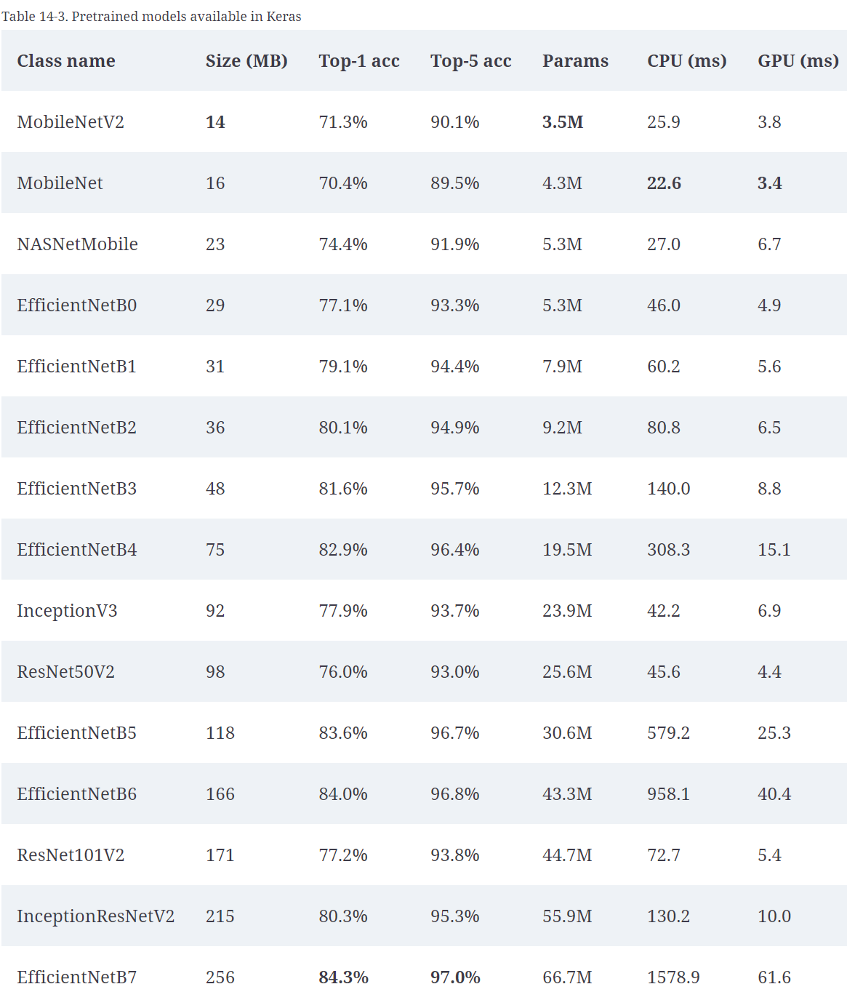

### Implement a pretrained model from Keras

In [35]:
model = tf.keras.applications.ResNet50(weights="imagenet")

This will create a ResNet-50 model and download weights pretrained on the ImageNet dataset. To use it, you first need to ensure that the images have the right size. A ResNet-50 model expects 224 × 224–pixel images (other models may expect other sizes, such as 299 × 299), so let’s use Keras’s Resizing layer (introduced in Chapter 13) to resize two sample images (after cropping them to the target aspect ratio):

In [36]:
images = load_sample_images()["images"]
images_resized = tf.keras.layers.Resizing(height=224, width=224,
                                          crop_to_aspect_ratio=True)(images)

The pretrained models assume that the images are preprocessed in a specific way. In some cases they may expect the inputs to be scaled from 0 to 1, or from –1 to 1, and so on. Each model provides a preprocess_input() function that you can use to preprocess your images. These functions assume that the original pixel values range from 0 to 255, which is the case here:

In [37]:
inputs = tf.keras.applications.resnet50.preprocess_input(images_resized)

In [38]:
Y_proba = model.predict(inputs)
Y_proba.shape

1/1 [==============================] - 2s 2s/step


(2, 1000)

As usual, the output Y_proba is a matrix with one row per image and one column per class (in this case, there are 1,000 classes). If you want to display the top K predictions, including the class name and the estimated probability of each predicted class, use the decode_predictions() function. For each image, it returns an array containing the top K predictions, where each prediction is represented as an array containing the class identifier,⁠28 its name, and the corresponding confidence score:

In [39]:
top_K = tf.keras.applications.resnet50.decode_predictions(Y_proba, top=3)
for image_index in range(len(images)):
    print(f"Image #{image_index}")
    for class_id, name, y_proba in top_K[image_index]:
        print(f"  {class_id} - {name:12s} {y_proba:.2%}")

Image #0
  n03877845 - palace       54.69%
  n03781244 - monastery    24.72%
  n02825657 - bell_cote    18.55%
Image #1
  n04522168 - vase         32.66%
  n11939491 - daisy        17.81%
  n03530642 - honeycomb    12.06%


The correct classes are palace and dahlia, so the model is correct for the first image but wrong for the second. However, that’s because dahlia is not one of the 1,000 ImageNet classes. With that in mind, vase is a reasonable guess (perhaps the flower is in a vase?), and daisy is not a bad choice either, since dahlias and daisies are both from the same Compositae family.

<Figure size 1000x600 with 0 Axes>

<AxesSubplot:>

(-0.5, 223.5, 223.5, -0.5)

<AxesSubplot:>

(-0.5, 223.5, 223.5, -0.5)

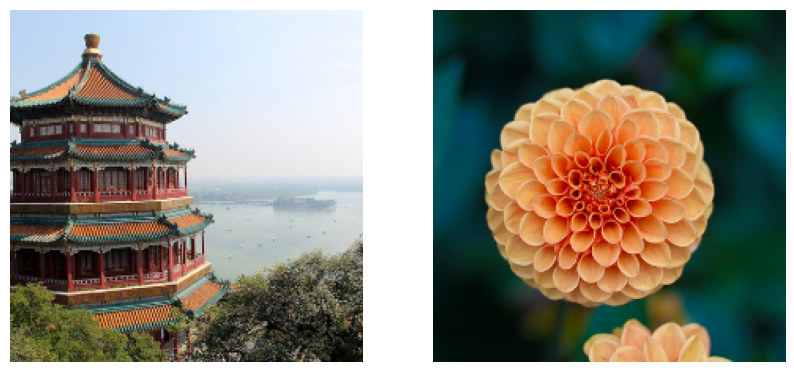

In [40]:
# extra code – displays the cropped and resized images

plt.figure(figsize=(10, 6))
for idx in (0, 1):
    plt.subplot(1, 2, idx + 1)
    plt.imshow(images_resized[idx] / 255)
    plt.axis("off")

plt.show()

# Pretrained Models for Transfer Learning

If you want to build an image classifier but you do not have enough data to train it from scratch, then it is often a good idea to reuse the lower layers of a pretrained model, as we discussed in Chapter 11. For example, let’s train a model to classify pictures of flowers, reusing a pretrained Xception model. First, we’ll load the flowers dataset using TensorFlow Datasets (introduced in Chapter 13):

In [41]:
import tensorflow_datasets as tfds

dataset, info = tfds.load("tf_flowers", as_supervised=True, with_info=True)
dataset_size = info.splits["train"].num_examples
class_names = info.features["label"].names
n_classes = info.features["label"].num_classes

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Generating splits...:   0%|          | 0/1 [00:00<?, ? splits/s]

Generating train examples...: 0 examples [00:00, ? examples/s]

Shuffling ~\tensorflow_datasets\tf_flowers\3.0.1.incompleteQMJWIX\tf_flowers-train.tfrecord*...:   0%|        …

Dataset tf_flowers downloaded and prepared to ~\tensorflow_datasets\tf_flowers\3.0.1. Subsequent calls will reuse this data.


In [42]:
dataset_size

3670

In [43]:
class_names

['dandelion', 'daisy', 'tulips', 'sunflowers', 'roses']

In [44]:
n_classes

5

Note that you can get information about the dataset by setting with_info=True. Here, we get the dataset size and the names of the classes. Unfortunately, there is only a "train" dataset, no test set or validation set, so we need to split the training set. Let’s call tfds.load() again, but this time taking the first 10% of the dataset for testing, the next 15% for validation, and the remaining 75% for training:

In [45]:
test_set_raw, valid_set_raw, train_set_raw = tfds.load(
    "tf_flowers",
    split=["train[:10%]", "train[10%:25%]", "train[25%:]"],
    as_supervised=True)

<Figure size 1200x1000 with 0 Axes>

<AxesSubplot:>

Text(0.5, 1.0, 'Class: dandelion')

(-0.5, 319.5, 221.5, -0.5)

<AxesSubplot:>

Text(0.5, 1.0, 'Class: dandelion')

(-0.5, 319.5, 239.5, -0.5)

<AxesSubplot:>

Text(0.5, 1.0, 'Class: dandelion')

(-0.5, 239.5, 239.5, -0.5)

<AxesSubplot:>

Text(0.5, 1.0, 'Class: dandelion')

(-0.5, 319.5, 215.5, -0.5)

<AxesSubplot:>

Text(0.5, 1.0, 'Class: dandelion')

(-0.5, 319.5, 239.5, -0.5)

<AxesSubplot:>

Text(0.5, 1.0, 'Class: roses')

(-0.5, 319.5, 239.5, -0.5)

<AxesSubplot:>

Text(0.5, 1.0, 'Class: dandelion')

(-0.5, 145.5, 239.5, -0.5)

<AxesSubplot:>

Text(0.5, 1.0, 'Class: tulips')

(-0.5, 499.5, 332.5, -0.5)

<AxesSubplot:>

Text(0.5, 1.0, 'Class: sunflowers')

(-0.5, 319.5, 212.5, -0.5)

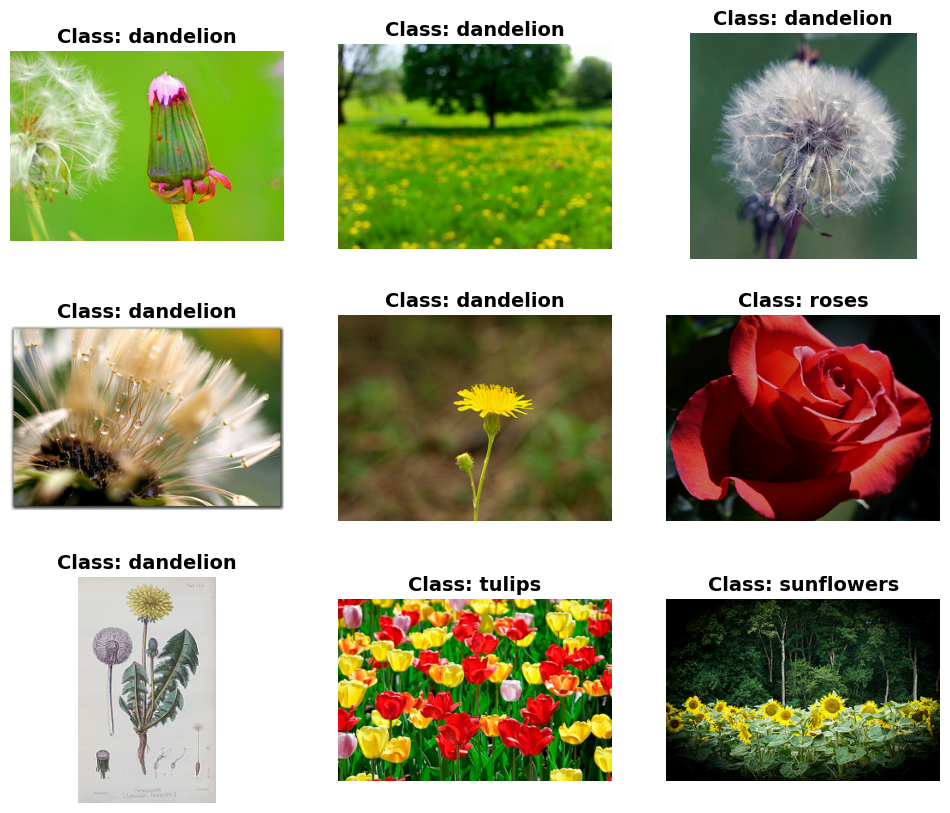

In [46]:
# extra code – displays the first 9 images in the validation set

plt.figure(figsize=(12, 10))
index = 0
for image, label in valid_set_raw.take(9):
    index += 1
    plt.subplot(3, 3, index)
    plt.imshow(image)
    plt.title(f"Class: {class_names[label]}")
    plt.axis("off")

plt.show()

All three datasets contain individual images. We need to batch them, but for this we first need to ensure they all have the same size, or else batching will not work. We can use a `Resizing` layer for this. We must also call the `tf.keras.applications.xception.preprocess_input()` function to preprocess the images appropriately for the Xception model. We will also add shuffling and prefetching to the training dataset.

In [47]:
tf.keras.backend.clear_session()  # extra code – resets layer name counter

batch_size = 32
preprocess = tf.keras.Sequential([
    tf.keras.layers.Resizing(height=224, width=224, crop_to_aspect_ratio=True),
    tf.keras.layers.Lambda(tf.keras.applications.xception.preprocess_input)
])
train_set = train_set_raw.map(lambda X, y: (preprocess(X), y))
train_set = train_set.shuffle(1000, seed=42).batch(batch_size).prefetch(1)
valid_set = valid_set_raw.map(lambda X, y: (preprocess(X), y)).batch(batch_size)
test_set = test_set_raw.map(lambda X, y: (preprocess(X), y)).batch(batch_size)

Let's take a look again at the first 9 images from the validation set: they're all 224x224 now, with values ranging from -1 to 1:

<Figure size 1200x1200 with 0 Axes>

<AxesSubplot:>

Text(0.5, 1.0, 'Class: dandelion')

(-0.5, 223.5, 223.5, -0.5)

<AxesSubplot:>

Text(0.5, 1.0, 'Class: dandelion')

(-0.5, 223.5, 223.5, -0.5)

<AxesSubplot:>

Text(0.5, 1.0, 'Class: dandelion')

(-0.5, 223.5, 223.5, -0.5)

<AxesSubplot:>

Text(0.5, 1.0, 'Class: dandelion')

(-0.5, 223.5, 223.5, -0.5)

<AxesSubplot:>

Text(0.5, 1.0, 'Class: dandelion')

(-0.5, 223.5, 223.5, -0.5)

<AxesSubplot:>

Text(0.5, 1.0, 'Class: roses')

(-0.5, 223.5, 223.5, -0.5)

<AxesSubplot:>

Text(0.5, 1.0, 'Class: dandelion')

(-0.5, 223.5, 223.5, -0.5)

<AxesSubplot:>

Text(0.5, 1.0, 'Class: tulips')

(-0.5, 223.5, 223.5, -0.5)

<AxesSubplot:>

Text(0.5, 1.0, 'Class: sunflowers')

(-0.5, 223.5, 223.5, -0.5)

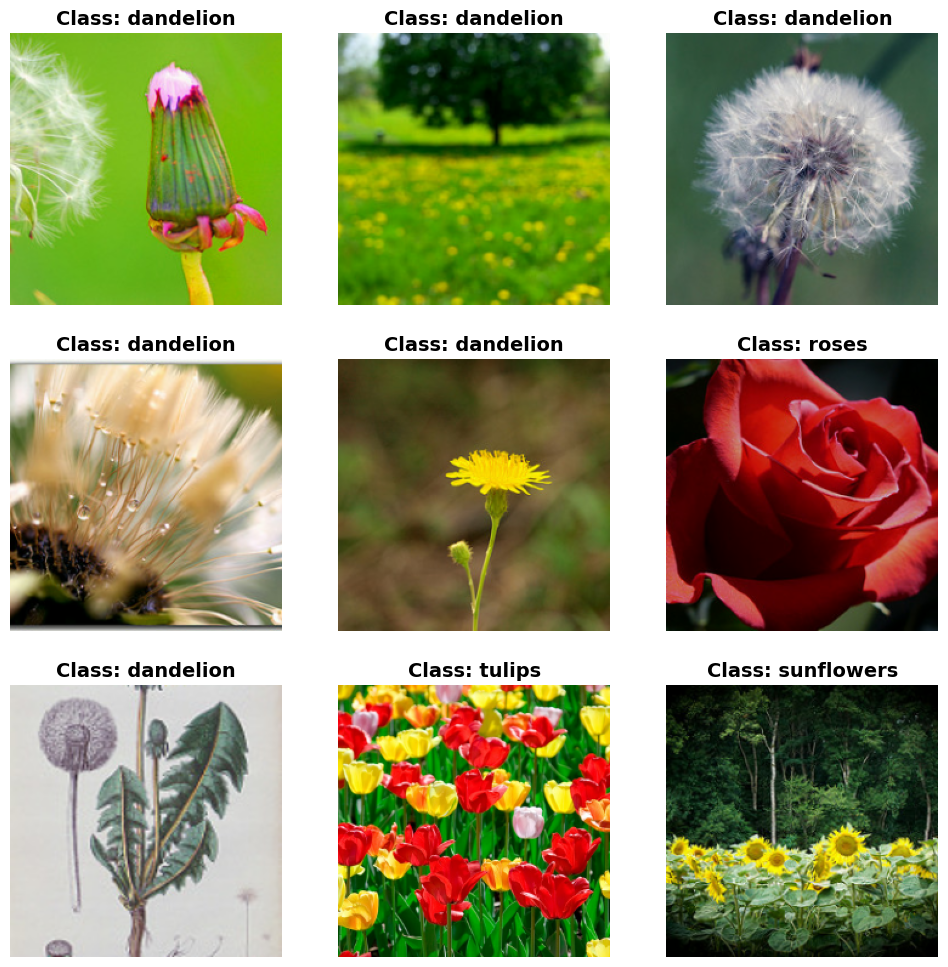

In [48]:
# extra code – displays the first 9 images in the first batch of valid_set

plt.figure(figsize=(12, 12))
for X_batch, y_batch in valid_set.take(1):
    for index in range(9):
        plt.subplot(3, 3, index + 1)
        plt.imshow((X_batch[index] + 1) / 2)  # rescale to 0–1 for imshow()
        plt.title(f"Class: {class_names[y_batch[index]]}")
        plt.axis("off")

plt.show()

Now each batch contains 32 images, all of them 224 × 224 pixels, with pixel values ranging from –1 to 1.

Since the dataset is not very large, a bit of data augmentation will certainly help. Let’s create a data augmentation model that we will embed in our final model. During training, it will randomly flip the images horizontally, rotate them a little bit, and tweak the contrast:

In [49]:
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip(mode="horizontal", seed=42),
    tf.keras.layers.RandomRotation(factor=0.05, seed=42),
    tf.keras.layers.RandomContrast(factor=0.2, seed=42)
])

The tf.keras.preprocessing.image.ImageDataGenerator class makes it easy to load images from disk and augment them in various ways: you can shift each image, rotate it, rescale it, flip it horizontally or vertically, shear it, or apply any transformation function you want to it. This is very convenient for simple projects. However, a tf.data pipeline is not much more complicated, and it’s generally faster. Moreover, if you have a GPU and you include the preprocessing or data augmentation layers inside your model, they will benefit from GPU acceleration during training.

Try running the following cell multiple times to see different random data augmentations:

<Figure size 1200x1200 with 0 Axes>

<AxesSubplot:>

Text(0.5, 1.0, 'Class: dandelion')

(-0.5, 223.5, 223.5, -0.5)

<AxesSubplot:>

Text(0.5, 1.0, 'Class: dandelion')

(-0.5, 223.5, 223.5, -0.5)

<AxesSubplot:>

Text(0.5, 1.0, 'Class: dandelion')

(-0.5, 223.5, 223.5, -0.5)

<AxesSubplot:>

Text(0.5, 1.0, 'Class: dandelion')

(-0.5, 223.5, 223.5, -0.5)

<AxesSubplot:>

Text(0.5, 1.0, 'Class: dandelion')

(-0.5, 223.5, 223.5, -0.5)

<AxesSubplot:>

Text(0.5, 1.0, 'Class: roses')

(-0.5, 223.5, 223.5, -0.5)

<AxesSubplot:>

Text(0.5, 1.0, 'Class: dandelion')

(-0.5, 223.5, 223.5, -0.5)

<AxesSubplot:>

Text(0.5, 1.0, 'Class: tulips')

(-0.5, 223.5, 223.5, -0.5)

<AxesSubplot:>

Text(0.5, 1.0, 'Class: sunflowers')

(-0.5, 223.5, 223.5, -0.5)

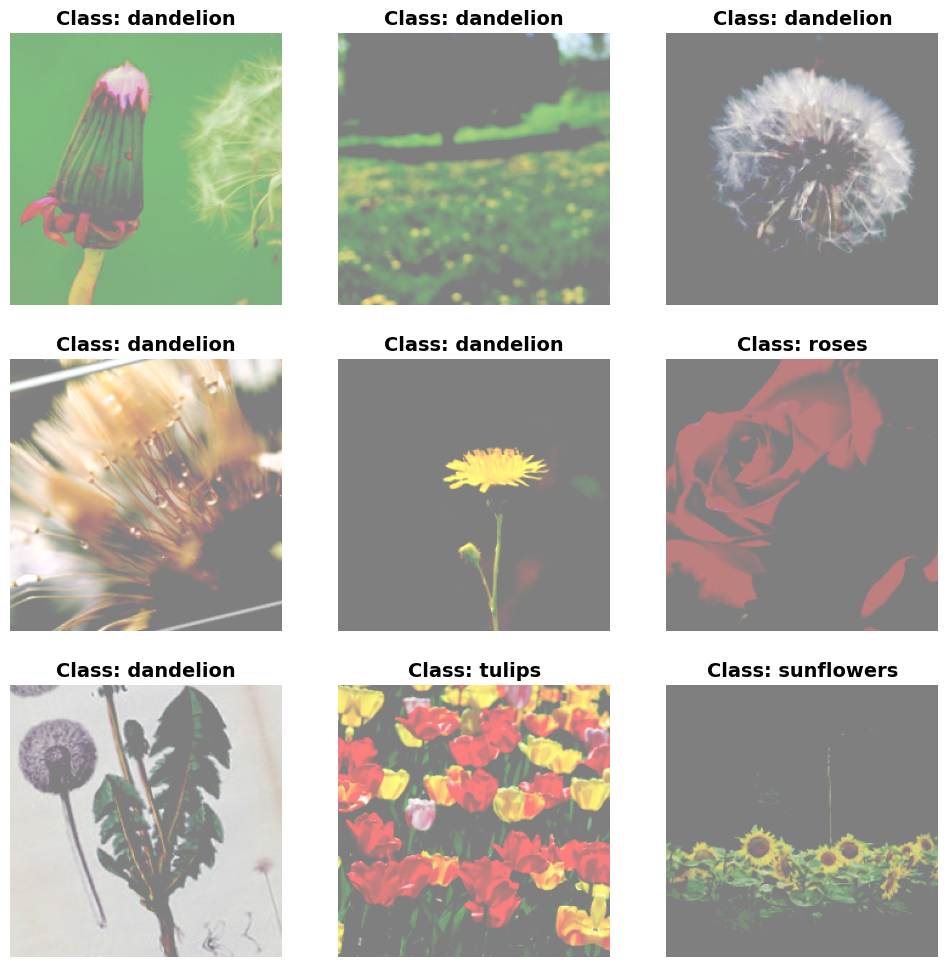

In [50]:
# extra code – displays the same first 9 images, after augmentation

plt.figure(figsize=(12, 12))
for X_batch, y_batch in valid_set.take(1):
    X_batch_augmented = data_augmentation(X_batch, training=True)
    for index in range(9):
        plt.subplot(3, 3, index + 1)
        # We must rescale the images to the 0-1 range for imshow(), and also
        # clip the result to that range, because data augmentation may
        # make some values go out of bounds (e.g., RandomContrast in this case).
        plt.imshow(np.clip((X_batch_augmented[index] + 1) / 2, 0, 1))
        plt.title(f"Class: {class_names[y_batch[index]]}")
        plt.axis("off")

plt.show()

Next let’s load an Xception model, pretrained on ImageNet. We exclude the top of the network by setting include_top=False. This excludes the global average pooling layer and the dense output layer. We then add our own global average pooling layer (feeding it the output of the base model), followed by a dense output layer with one unit per class, using the softmax activation function. Finally, we wrap all this in a Keras Model:

In [51]:
tf.random.set_seed(42)  # extra code – ensures reproducibility
base_model = tf.keras.applications.xception.Xception(weights="imagenet",
                                                     include_top=False)
avg = tf.keras.layers.GlobalAveragePooling2D()(base_model.output)
output = tf.keras.layers.Dense(n_classes, activation="softmax")(avg)
model = tf.keras.Model(inputs=base_model.input, outputs=output)

As explained in Chapter 11, it’s usually a good idea to freeze the weights of the pretrained layers, at least at the beginning of training:

Since our model uses the base model’s layers directly, rather than the base_model object itself, setting base_model.trainable=False would have no effect.

In [52]:
for layer in base_model.layers:
    layer.trainable = False

Let's train the model for a few epochs, while keeping the base model weights fixed:

In [53]:
optimizer = tf.keras.optimizers.SGD(learning_rate=0.1, momentum=0.9)
model.compile(loss="sparse_categorical_crossentropy", optimizer=optimizer,
              metrics=["accuracy"])
history = model.fit(train_set, validation_data=valid_set, epochs=3)

Epoch 1/3
86/86 [==============================] - 36s 344ms/step - loss: 0.7723 - accuracy: 0.8070 - val_loss: 0.7590 - val_accuracy: 0.8512
Epoch 2/3
86/86 [==============================] - 27s 311ms/step - loss: 0.3118 - accuracy: 0.9135 - val_loss: 0.5960 - val_accuracy: 0.8494
Epoch 3/3
86/86 [==============================] - 28s 320ms/step - loss: 0.1729 - accuracy: 0.9419 - val_loss: 0.8077 - val_accuracy: 0.8403


In [54]:
for indices in zip(range(33), range(33, 66), range(66, 99), range(99, 132)):
    for idx in indices:
        print(f"{idx:3}: {base_model.layers[idx].name:22}", end="")
    print()

  0: input_1                33: block4_pool            66: block8_sepconv1_act    99: block11_sepconv2_act  
  1: block1_conv1           34: batch_normalization_2  67: block8_sepconv1       100: block11_sepconv2      
  2: block1_conv1_bn        35: add_2                  68: block8_sepconv1_bn    101: block11_sepconv2_bn   
  3: block1_conv1_act       36: block5_sepconv1_act    69: block8_sepconv2_act   102: block11_sepconv3_act  
  4: block1_conv2           37: block5_sepconv1        70: block8_sepconv2       103: block11_sepconv3      
  5: block1_conv2_bn        38: block5_sepconv1_bn     71: block8_sepconv2_bn    104: block11_sepconv3_bn   
  6: block1_conv2_act       39: block5_sepconv2_act    72: block8_sepconv3_act   105: add_9                 
  7: block2_sepconv1        40: block5_sepconv2        73: block8_sepconv3       106: block12_sepconv1_act  
  8: block2_sepconv1_bn     41: block5_sepconv2_bn     74: block8_sepconv3_bn    107: block12_sepconv1      
  9: block2_sepconv

After training the model for a few epochs, its validation accuracy should reach a bit over 80% and then stop improving. This means that the top layers are now pretty well trained, and we are ready to unfreeze some of the base model’s top layers, then continue training. For example, let’s unfreeze layers 56 and above (that’s the start of residual unit 7 out of 14, as you can see if you list the layer names):

Now that the weights of our new top layers are not too bad, we can make the top part of the base model trainable again, and continue training, but with a lower learning rate:

In [55]:
for layer in base_model.layers[56:]:
    layer.trainable = True

optimizer = tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.9)
model.compile(loss="sparse_categorical_crossentropy", optimizer=optimizer,
              metrics=["accuracy"])
history = model.fit(train_set, validation_data=valid_set, epochs=10)

Epoch 1/10
86/86 [==============================] - 64s 611ms/step - loss: 0.2961 - accuracy: 0.9113 - val_loss: 0.4626 - val_accuracy: 0.8784
Epoch 2/10
86/86 [==============================] - 53s 613ms/step - loss: 0.0450 - accuracy: 0.9840 - val_loss: 0.3605 - val_accuracy: 0.9002
Epoch 3/10
86/86 [==============================] - 53s 606ms/step - loss: 0.0148 - accuracy: 0.9953 - val_loss: 0.3795 - val_accuracy: 0.9038
Epoch 4/10
86/86 [==============================] - 53s 605ms/step - loss: 0.0143 - accuracy: 0.9956 - val_loss: 0.3862 - val_accuracy: 0.8947
Epoch 5/10
86/86 [==============================] - 54s 613ms/step - loss: 0.0114 - accuracy: 0.9960 - val_loss: 0.3718 - val_accuracy: 0.8947
Epoch 6/10
86/86 [==============================] - 53s 602ms/step - loss: 0.0070 - accuracy: 0.9978 - val_loss: 0.3605 - val_accuracy: 0.9038
Epoch 7/10
86/86 [==============================] - 53s 607ms/step - loss: 0.0037 - accuracy: 0.9996 - val_loss: 0.3565 - val_accuracy: 0.9093

This model should reach around 92% accuracy on the test set, in just a few minutes of training (with a GPU). If you tune the hyperparameters, lower the learning rate, and train for quite a bit longer, you should be able to reach 95% to 97%. With that, you can start training amazing image classifiers on your own images and classes! But there’s more to computer vision than just classification. For example, what if you also want to know where the flower is in a picture? Let’s look at this now.

# Classification and Localization

Localizing an object in a picture can be expressed as a regression task, as discussed in Chapter 10: to predict a bounding box around the object, a common approach is to predict the horizontal and vertical coordinates of the object’s center, as well as its height and width. This means we have four numbers to predict. It does not require much change to the model; we just need to add a second dense output layer with four units (typically on top of the global average pooling layer), and it can be trained using the MSE loss:

In [66]:
tf.random.set_seed(42)  # extra code – ensures reproducibility
base_model = tf.keras.applications.xception.Xception(weights="imagenet",
                                                     include_top=False)
avg = tf.keras.layers.GlobalAveragePooling2D()(base_model.output)
class_output = tf.keras.layers.Dense(n_classes, activation="softmax")(avg)
loc_output = tf.keras.layers.Dense(4)(avg)
model = tf.keras.Model(inputs=base_model.input,
                       outputs=[class_output, loc_output])
model.compile(loss=["sparse_categorical_crossentropy", "mse"],
              loss_weights=[0.8, 0.2],  # depends on what you care most about
              optimizer=optimizer, metrics=["accuracy"])

But now we have a problem: the flowers dataset does not have bounding boxes around the flowers. So, we need to add them ourselves. This is often one of the hardest and most costly parts of a machine learning project: getting the labels. It’s a good idea to spend time looking for the right tools. To annotate images with bounding boxes, you may want to use an open source image labeling tool like VGG Image Annotator, LabelImg, OpenLabeler, or ImgLab, or perhaps a commercial tool like LabelBox or Supervisely. You may also want to consider crowdsourcing platforms such as Amazon Mechanical Turk if you have a very large number of images to annotate. However, it is quite a lot of work to set up a crowdsourcing platform, prepare the form to be sent to the workers, supervise them, and ensure that the quality of the bounding boxes they produce is good, so make sure it is worth the effort. Adriana Kovashka et al. wrote a very practical paper⁠29 about crowdsourcing in computer vision. I recommend you check it out, even if you do not plan to use crowdsourcing. If there are just a few hundred or a even a couple thousand images to label, and you don’t plan to do this frequently, it may be preferable to do it yourself: with the right tools, it will only take a few days, and you’ll also gain a better understanding of your dataset and task.

Now let’s suppose you’ve obtained the bounding boxes for every image in the flowers dataset (for now we will assume there is a single bounding box per image). You then need to create a dataset whose items will be batches of preprocessed images along with their class labels and their bounding boxes. Each item should be a tuple of the form (images, (class_labels, bounding_boxes)). Then you are ready to train your model!

TIP
The bounding boxes should be normalized so that the horizontal and vertical coordinates, as well as the height and width, all range from 0 to 1. Also, it is common to predict the square root of the height and width rather than the height and width directly: this way, a 10-pixel error for a large bounding box will not be penalized as much as a 10-pixel error for a small bounding box.

The MSE often works fairly well as a cost function to train the model, but it is not a great metric to evaluate how well the model can predict bounding boxes. The most common metric for this is the intersection over union (IoU): the area of overlap between the predicted bounding box and the target bounding box, divided by the area of their union (see Figure 14-24). In Keras, it is implemented by the tf.keras.metrics.MeanIoU class.

In [ ]:
# extra code – fits the model using random target bounding boxes (in real life
#              you would need to create proper targets instead)

def add_random_bounding_boxes(images, labels):
    fake_bboxes = tf.random.uniform([tf.shape(images)[0], 4])
    return images, (labels, fake_bboxes)

fake_train_set = train_set.take(5).repeat(2).map(add_random_bounding_boxes)
model.fit(fake_train_set, epochs=2)

# Extra Material – How mAP Relates to Precision/Recall

In [58]:
def maximum_precisions(precisions):
    return np.flip(np.maximum.accumulate(np.flip(precisions)))

Text(0.5, 0, 'Recall')

Text(0, 0.5, 'Precision')

(0.0, 1.0, 0.0, 1.0)

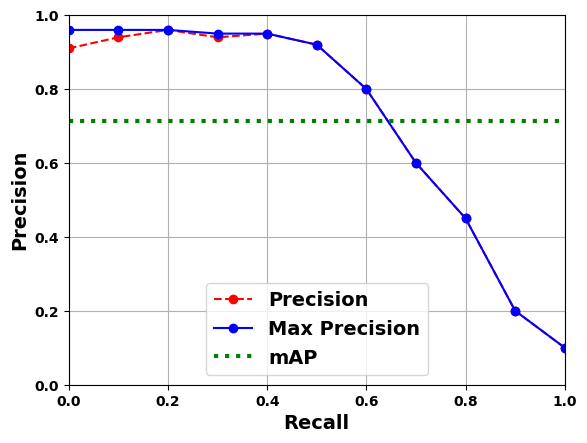

In [59]:
recalls = np.linspace(0, 1, 11)

precisions = [0.91, 0.94, 0.96, 0.94, 0.95, 0.92, 0.80, 0.60, 0.45, 0.20, 0.10]
max_precisions = maximum_precisions(precisions)
mAP = max_precisions.mean()
plt.plot(recalls, precisions, "ro--", label="Precision")
plt.plot(recalls, max_precisions, "bo-", label="Max Precision")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.plot([0, 1], [mAP, mAP], "g:", linewidth=3, label="mAP")
plt.grid(True)
plt.axis([0, 1, 0, 1])
plt.legend(loc="lower center")
plt.show()

# Exercises

## 1. to 8.

1. These are the main advantages of a CNN over a fully connected DNN for image classification:
    * Because consecutive layers are only partially connected and because it heavily reuses its weights, a CNN has many fewer parameters than a fully connected DNN, which makes it much faster to train, reduces the risk of overfitting, and requires much less training data.
    * When a CNN has learned a kernel that can detect a particular feature, it can detect that feature anywhere in the image. In contrast, when a DNN learns a feature in one location, it can detect it only in that particular location. Since images typically have very repetitive features, CNNs are able to generalize much better than DNNs for image processing tasks such as classification, using fewer training examples.
    * Finally, a DNN has no prior knowledge of how pixels are organized; it does not know that nearby pixels are close. A CNN's architecture embeds this prior knowledge. Lower layers typically identify features in small areas of the images, while higher layers combine the lower-level features into larger features. This works well with most natural images, giving CNNs a decisive head start compared to DNNs.
2. Let's compute how many parameters the CNN has.
    * Since its first convolutional layer has 3 × 3 kernels, and the input has three channels (red, green, and blue), each feature map has 3 × 3 × 3 weights, plus a bias term. That's 28 parameters per feature map. Since this first convolutional layer has 100 feature maps, it has a total of 2,800 parameters. The second convolutional layer has 3 × 3 kernels and its input is the set of 100 feature maps of the previous layer, so each feature map has 3 × 3 × 100 = 900 weights, plus a bias term. Since it has 200 feature maps, this layer has 901 × 200 = 180,200 parameters. Finally, the third and last convolutional layer also has 3 × 3 kernels, and its input is the set of 200 feature maps of the previous layers, so each feature map has 3 × 3 × 200 = 1,800 weights, plus a bias term. Since it has 400 feature maps, this layer has a total of 1,801 × 400 = 720,400 parameters. All in all, the CNN has 2,800 + 180,200 + 720,400 =  903,400 parameters.<br/>
    * Now let's compute how much RAM this neural network will require (at least) when making a prediction for a single instance. First let's compute the feature map size for each layer. Since we are using a stride of 2 and `"same"` padding, the horizontal and vertical dimensions of the feature maps are divided by 2 at each layer (rounding up if necessary). So, as the input channels are 200 × 300 pixels, the first layer's feature maps are 100 × 150, the second layer's feature maps are 50 × 75, and the third layer's feature maps are 25 × 38. Since 32 bits is 4 bytes and the first convolutional layer has 100 feature maps, this first layer takes up 4 × 100 × 150 × 100 = 6 million bytes (6 MB). The second layer takes up 4 × 50 × 75 × 200 = 3 million bytes (3 MB). Finally, the third layer takes up 4 × 25 × 38 × 400 = 1,520,000 bytes (about 1.5 MB). However, once a layer has been computed, the memory occupied by the previous layer can be released, so if everything is well optimized, only 6 + 3 = 9 million bytes (9 MB) of RAM will be required (when the second layer has just been computed, but the memory occupied by the first layer has not been released yet). But wait, you also need to add the memory occupied by the CNN's parameters! We computed earlier that it has 903,400 parameters, each using up 4 bytes, so this adds 3,613,600 bytes (about 3.6 MB). The total RAM required is therefore (at least) 12,613,600 bytes (about 12.6 MB).<br/>
    * Lastly, let's compute the minimum amount of RAM required when training the CNN on a mini-batch of 50 images. During training TensorFlow uses backpropagation, which requires keeping all values computed during the forward pass until the reverse pass begins. So we must compute the total RAM required by all layers for a single instance and multiply that by 50. At this point, let's start counting in megabytes rather than bytes. We computed before that the three layers require respectively 6, 3, and 1.5 MB for each instance. That's a total of 10.5 MB per instance, so for 50 instances the total RAM required is 525 MB. Add to that the RAM required by the input images, which is 50 × 4 × 200 × 300 × 3 = 36 million bytes (36 MB), plus the RAM required for the model parameters, which is about 3.6 MB (computed earlier), plus some RAM for the gradients (we will neglect this since it can be released gradually as backpropagation goes down the layers during the reverse pass). We are up to a total of roughly 525 + 36 + 3.6 = 564.6 MB, and that's really an optimistic bare minimum.
3. If your GPU runs out of memory while training a CNN, here are five things you could try to solve the problem (other than purchasing a GPU with more RAM):
    * Reduce the mini-batch size.
    * Reduce dimensionality using a larger stride in one or more layers.
    * Remove one or more layers.
    * Use 16-bit floats instead of 32-bit floats.
    * Distribute the CNN across multiple devices.
4. A max pooling layer has no parameters at all, whereas a convolutional layer has quite a few (see the previous questions).
5. A local response normalization layer makes the neurons that most strongly activate inhibit neurons at the same location but in neighboring feature maps, which encourages different feature maps to specialize and pushes them apart, forcing them to explore a wider range of features. It is typically used in the lower layers to have a larger pool of low-level features that the upper layers can build upon.
6. The main innovations in AlexNet compared to LeNet-5 are that it is much larger and deeper, and it stacks convolutional layers directly on top of each other, instead of stacking a pooling layer on top of each convolutional layer. The main innovation in GoogLeNet is the introduction of _inception modules_, which make it possible to have a much deeper net than previous CNN architectures, with fewer parameters. ResNet's main innovation is the introduction of skip connections, which make it possible to go well beyond 100 layers. Arguably, its simplicity and consistency are also rather innovative. SENet's main innovation was the idea of using an SE block (a two-layer dense network) after every inception module in an inception network or every residual unit in a ResNet to recalibrate the relative importance of feature maps. Xception's main innovation was the use of depthwise separable convolutional layers, which look at spatial patterns and depthwise patterns separately. Lastly, EfficientNet's main innotation was the compound scaling method, to efficiently scale a model to a larger compute budget.
7. Fully convolutional networks are neural networks composed exclusively of convolutional and pooling layers. FCNs can efficiently process images of any width and height (at least above the minimum size). They are most useful for object detection and semantic segmentation because they only need to look at the image once (instead of having to run a CNN multiple times on different parts of the image). If you have a CNN with some dense layers on top, you can convert these dense layers to convolutional layers to create an FCN: just replace the lowest dense layer with a convolutional layer with a kernel size equal to the layer's input size, with one filter per neuron in the dense layer, and using `"valid"` padding. Generally the stride should be 1, but you can set it to a higher value if you want. The activation function should be the same as the dense layer's. The other dense layers should be converted the same way, but using 1 × 1 filters. It is actually possible to convert a trained CNN this way by appropriately reshaping the dense layers' weight matrices.
8. The main technical difficulty of semantic segmentation is the fact that a lot of the spatial information gets lost in a CNN as the signal flows through each layer, especially in pooling layers and layers with a stride greater than 1. This spatial information needs to be restored somehow to accurately predict the class of each pixel.

## 9. High Accuracy CNN for MNIST
_Exercise: Build your own CNN from scratch and try to achieve the highest possible accuracy on MNIST._

The following model uses 2 convolutional layers, followed by 1 pooling layer, then dropout 25%, then a dense layer, another dropout layer but with 50% dropout, and finally the output layer. It reaches about 99.2% accuracy on the test set. This places this model roughly in the top 20% in the [MNIST Kaggle competition](https://www.kaggle.com/c/digit-recognizer/) (if we ignore the models with an accuracy greater than 99.79% which were most likely trained on the test set, as explained by Chris Deotte in [this post](https://www.kaggle.com/c/digit-recognizer/discussion/61480)). Can you do better? To reach 99.5 to 99.7% accuracy on the test set, you need to add image augmentation, batch norm, use a learning schedule such as 1-cycle, and possibly create an ensemble.

In [60]:
mnist = tf.keras.datasets.mnist.load_data()
(X_train_full, y_train_full), (X_test, y_test) = mnist
X_train_full = X_train_full / 255.
X_test = X_test / 255.
X_train, X_valid = X_train_full[:-5000], X_train_full[-5000:]
y_train, y_valid = y_train_full[:-5000], y_train_full[-5000:]

X_train = X_train[..., np.newaxis]
X_valid = X_valid[..., np.newaxis]
X_test = X_test[..., np.newaxis]

In [61]:
tf.keras.backend.clear_session()
tf.random.set_seed(42)
np.random.seed(42)

model = tf.keras.Sequential([
    tf.keras.layers.Conv2D(32, kernel_size=3, padding="same",
                           activation="relu", kernel_initializer="he_normal"),
    tf.keras.layers.Conv2D(64, kernel_size=3, padding="same",
                           activation="relu", kernel_initializer="he_normal"),
    tf.keras.layers.MaxPool2D(),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Dense(128, activation="relu",
                          kernel_initializer="he_normal"),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(10, activation="softmax")
])
model.compile(loss="sparse_categorical_crossentropy", optimizer="nadam",
              metrics=["accuracy"])

model.fit(X_train, y_train, epochs=10, validation_data=(X_valid, y_valid))
model.evaluate(X_test, y_test)

Epoch 1/10
1719/1719 [==============================] - 26s 15ms/step - loss: 0.2122 - accuracy: 0.9359 - val_loss: 0.0480 - val_accuracy: 0.9878
Epoch 2/10
1719/1719 [==============================] - 27s 16ms/step - loss: 0.0882 - accuracy: 0.9734 - val_loss: 0.0432 - val_accuracy: 0.9878
Epoch 3/10
1719/1719 [==============================] - 26s 15ms/step - loss: 0.0666 - accuracy: 0.9799 - val_loss: 0.0393 - val_accuracy: 0.9890
Epoch 4/10
1719/1719 [==============================] - 26s 15ms/step - loss: 0.0556 - accuracy: 0.9829 - val_loss: 0.0430 - val_accuracy: 0.9900
Epoch 5/10
1719/1719 [==============================] - 28s 16ms/step - loss: 0.0456 - accuracy: 0.9854 - val_loss: 0.0321 - val_accuracy: 0.9930
Epoch 6/10
1719/1719 [==============================] - 27s 16ms/step - loss: 0.0363 - accuracy: 0.9883 - val_loss: 0.0337 - val_accuracy: 0.9916
Epoch 7/10
1719/1719 [==============================] - 27s 16ms/step - loss: 0.0346 - accuracy: 0.9889 - val_loss: 0.0326 -

313/313 [==============================] - 1s 4ms/step - loss: 0.0333 - accuracy: 0.9902


[0.03332114964723587, 0.9901999831199646]

## 10.  Use transfer learning for large image classification

_Exercise: Use transfer learning for large image classification, going through these steps:_

* _Create a training set containing at least 100 images per class. For example, you could classify your own pictures based on the location (beach, mountain, city, etc.), or alternatively you can use an existing dataset (e.g., from TensorFlow Datasets)._
* _Split it into a training set, a validation set, and a test set._
* _Build the input pipeline, including the appropriate preprocessing operations, and optionally add data augmentation._
* _Fine-tune a pretrained model on this dataset._

See the Flowers example above.

## 11.
_Exercise: Go through TensorFlow's [Style Transfer tutorial](https://homl.info/styletuto). It is a fun way to generate art using Deep Learning._


Simply open the Colab and follow its instructions.